<a href="https://colab.research.google.com/github/amalvara/Testing/blob/master/Tesis_DescargaImagenes_2023_05_12_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:

%pip install segment-geospatial
%pip install geopandas


In [ ]:
import os
import leafmap
from samgeo import SamGeo, tms_to_geotiff, get_basemaps


In [ ]:
import requests
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
from shapely.geometry import Point
import random


# Descarga de Imágenes



## 1. Selección de la muestra

Se utiliza zonas censales del Censo Nacional, la cual contienen las coordenadas de geolocalización. Luego se genera el GeoDataFrame con latitud y longitud de sus centroides.




In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
main_path='/content/gdrive/My Drive/Tesis/'
os.chdir(main_path)

Mounted at /content/gdrive


In [ ]:
comunas = gpd.read_file('Inputs/ZONA_C17.shp')
comunas['zonacensal'] = np.arange(len(comunas))
comunas=comunas[comunas['NOM_COMUNA'].isin(['LAS CONDES', 'LO BARNECHEA', 'VITACURA', 'HUECHURABA', 'PUDAHUEL',
       'QUILICURA', 'CERRILLOS', 'LO ESPEJO', 'MAIPÚ', 'EL BOSQUE',
       'LA PINTANA', 'LA CISTERNA', 'SAN RAMÓN', 'LA FLORIDA',
       'LA GRANJA', 'LA REINA', 'ÑUÑOA', 'MACUL', 'SAN JOAQUÍN',
       'INDEPENDENCIA', 'RECOLETA', 'CONCHALÍ', 'RENCA', 'CERRO NAVIA',
       'QUINTA NORMAL', 'SANTIAGO', 'ESTACIÓN CENTRAL', 'LO PRADO',
       'PEDRO AGUIRRE CERDA', 'SAN MIGUEL', 'PROVIDENCIA',
       'PEÑALOLÉN', 'PUENTE ALTO','SAN BERNARDO'])]

comunas=comunas[['NOM_COMUNA', 'geometry', 'zonacensal']]

In [ ]:
comunas.head()

,NOM_COMUNA,geometry,zonacensal
37,PUDAHUEL,"POLYGON ((-70.86236 -33.39762, -70.86255 -33.3...",37
38,PUDAHUEL,"POLYGON ((-70.87151 -33.40417, -70.87152 -33.4...",38
39,PUDAHUEL,"POLYGON ((-70.81704 -33.38777, -70.81704 -33.3...",39
115,LA PINTANA,"POLYGON ((-70.64114 -33.56398, -70.64121 -33.5...",115
116,PEDRO AGUIRRE CERDA,"POLYGON ((-70.65571 -33.47856, -70.65575 -33.4...",116


In [ ]:

comunas = comunas[['NOM_COMUNA', 'geometry', 'zonacensal']]
comunas['Centroide'] = comunas.centroid
df = gpd.GeoDataFrame(comunas['Centroide'], comunas['zonacensal'])
df.head()


,Centroide
zonacensal,
37,POINT (-70.86478 -33.39455)
38,POINT (-70.87475 -33.39618)
39,POINT (-70.81821 -33.38662)
115,POINT (-70.64371 -33.56233)
116,POINT (-70.66347 -33.47735)


In [ ]:
len(df)

1644

In [ ]:
df = df.reset_index()

In [ ]:
# Función que genera una muestra de cada zona censal
def random_points_in_polygon(number, polygon):
    points = []
    min_x, min_y, max_x, max_y = polygon.bounds
    i= 0
    while i < number:
        point = Point(random.uniform(min_x, max_x), random.uniform(min_y, max_y))
        if polygon.contains(point):
            points.append(point)
            i += 1
    return points

In [ ]:
points = random_points_in_polygon(5, comunas.iloc[0].geometry)

# Ejemplo para la primera zona censal obtenemos las cordenadas de todos los puntos
for i, point in enumerate(points):
    print("Point {}: ({},{})".format(str(i+1), point.x, point.y))

Point 1: (-70.86319848611738,-33.395160374447954)
Point 2: (-70.8673757444642,-33.39505899040184)
Point 3: (-70.8651438101073,-33.39302085466525)
Point 4: (-70.86623533544014,-33.39327994388024)
Point 5: (-70.8671188958809,-33.398104756604916)


In [ ]:
df_aux = gpd.GeoDataFrame([], columns = df.columns)
df_aux2 = gpd.GeoDataFrame([], columns = df.columns)

In [ ]:
comuna2 = comunas.reset_index()[:]

In [ ]:
jj = 0
for zona in df.zonacensal:

  df_aux = pd.concat([df_aux, df.loc[df.zonacensal == zona]])
  df_aux2 = pd.concat([df.loc[df.zonacensal == zona], df.loc[df.zonacensal == zona],df.loc[df.zonacensal == zona], df.loc[df.zonacensal == zona]]).reset_index(drop=True)
  points = random_points_in_polygon(5, comuna2.iloc[jj].geometry)

  jj += 1

  for i, point in enumerate(points):
    df_aux2["Centroide"][i+1] = point
  df_aux = pd.concat([df_aux, df_aux2]).reset_index(drop=True)

In [ ]:
df_aux = df_aux.rename(columns={'Centroide':'Puntos'})
df_aux.head(10)

,zonacensal,Puntos
0,37,POINT (-70.86478 -33.39455)
1,37,POINT (-70.86478 -33.39455)
2,37,POINT (-70.86508 -33.39978)
3,37,POINT (-70.86542 -33.39831)
4,37,POINT (-70.86235 -33.39551)
5,38,POINT (-70.87475 -33.39618)
6,38,POINT (-70.87475 -33.39618)
7,38,POINT (-70.87340 -33.40194)
8,38,POINT (-70.87149 -33.38914)
9,38,POINT (-70.87328 -33.40222)


In [ ]:
df_aux["zonacensal"] = df_aux["zonacensal"].astype('str')
comunas["zonacensal"] = comunas["zonacensal"].astype('str')

In [ ]:
comunas = comunas.merge(df_aux, on='zonacensal', how='right')

In [ ]:
comunas.head()

,NOM_COMUNA,geometry,zonacensal,Centroide,Puntos
0,PUDAHUEL,"POLYGON ((-70.86236 -33.39762, -70.86255 -33.3...",37,POINT (-70.86478 -33.39455),POINT (-70.86478 -33.39455)
1,PUDAHUEL,"POLYGON ((-70.86236 -33.39762, -70.86255 -33.3...",37,POINT (-70.86478 -33.39455),POINT (-70.86478 -33.39455)
2,PUDAHUEL,"POLYGON ((-70.86236 -33.39762, -70.86255 -33.3...",37,POINT (-70.86478 -33.39455),POINT (-70.86508 -33.39978)
3,PUDAHUEL,"POLYGON ((-70.86236 -33.39762, -70.86255 -33.3...",37,POINT (-70.86478 -33.39455),POINT (-70.86542 -33.39831)
4,PUDAHUEL,"POLYGON ((-70.86236 -33.39762, -70.86255 -33.3...",37,POINT (-70.86478 -33.39455),POINT (-70.86235 -33.39551)


In [ ]:
fig=plt.figure(figsize=(30,30))
ax=fig.add_subplot(111)

comunas.boundary.plot(ax=ax,lw=0.8,color='black')
comunas['Puntos'].plot(ax=ax, color='turquoise')


<Axes: >

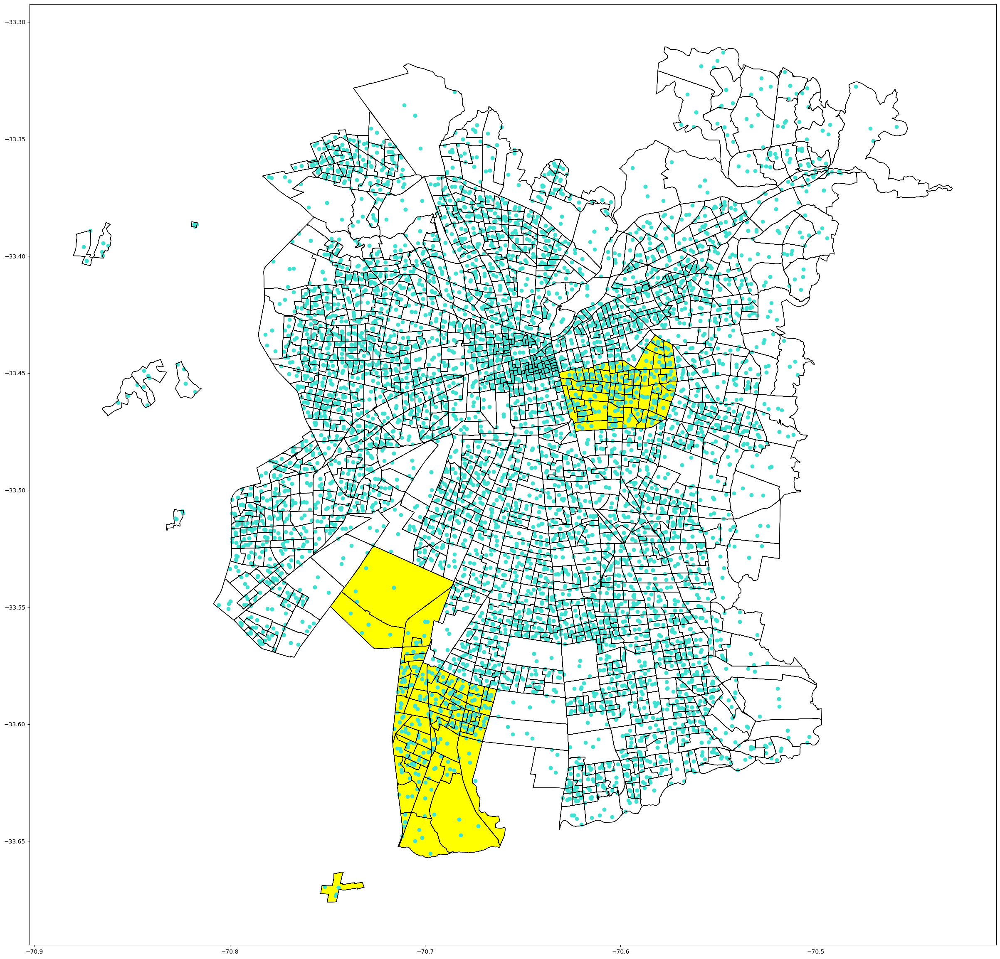

In [ ]:
fig=plt.figure(figsize=(30,30))
ax=fig.add_subplot(111)
comunas[comunas['NOM_COMUNA'] == 'ÑUÑOA'].plot(ax=ax, color='yellow')
comunas[comunas['NOM_COMUNA'] == 'SAN BERNARDO'].plot(ax=ax, color='yellow')
comunas.boundary.plot(ax=ax,lw=0.8,color='black')
comunas['Puntos'].plot(ax=ax, color='turquoise')


In [ ]:
s=gpd.GeoSeries(df_aux['Puntos'])
df_aux['longitud'] = s.x
df_aux['latitud'] = s.y

In [ ]:
df_geo_puntos = df_aux[:]

In [ ]:
df_geo_puntos.head()

,zonacensal,Puntos,longitud,latitud
0,37,POINT (-70.86478 -33.39455),-70.864776,-33.394551
1,37,POINT (-70.86478 -33.39455),-70.864776,-33.394551
2,37,POINT (-70.86508 -33.39978),-70.865078,-33.399780
3,37,POINT (-70.86542 -33.39831),-70.865416,-33.398312
4,37,POINT (-70.86235 -33.39551),-70.862350,-33.395511


## 2. Descarga de imágenes de la muestra

In [ ]:
longitud = df_geo_puntos["longitud"]
latitud =  df_geo_puntos["latitud"]

In [ ]:

m = leafmap.Map(center=[latitud[2], longitud[2]], zoom=19)
m.add_basemap("SATELLITE")
m

Map(center=[-33.39166746863676, -70.8635471372887], controls=(ZoomControl(options=['position', 'zoom_in_text',…

In [ ]:
latitud= -33.45694
longitud= -70.64827
m = leafmap.Map(center=[latitud, longitud], zoom=19)
m.add_basemap("SATELLITE")
m

Map(center=[-33.45694, -70.64827], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title',…

In [ ]:
a = 0.00122
b = 0.00064
if m.user_roi_bounds() is not None:
    bbox = m.user_roi_bounds()
else:
    bbox = [ longitud-a, latitud - b, longitud +a , latitud +b]




In [ ]:
image = "satellite.tif"

In [ ]:
tms_to_geotiff(output=image, bbox=bbox, zoom=20, source="Satellite", overwrite=True)

Downloaded image 01/48
Downloaded image 02/48
Downloaded image 03/48
Downloaded image 04/48
Downloaded image 05/48
Downloaded image 06/48
Downloaded image 07/48
Downloaded image 08/48
Downloaded image 09/48
Downloaded image 10/48
Downloaded image 11/48
Downloaded image 12/48
Downloaded image 13/48
Downloaded image 14/48
Downloaded image 15/48
Downloaded image 16/48
Downloaded image 17/48
Downloaded image 18/48
Downloaded image 19/48
Downloaded image 20/48
Downloaded image 21/48
Downloaded image 22/48
Downloaded image 23/48
Downloaded image 24/48
Downloaded image 25/48
Downloaded image 26/48
Downloaded image 27/48
Downloaded image 28/48
Downloaded image 29/48
Downloaded image 30/48
Downloaded image 31/48
Downloaded image 32/48
Downloaded image 33/48
Downloaded image 34/48
Downloaded image 35/48
Downloaded image 36/48
Downloaded image 37/48
Downloaded image 38/48
Downloaded image 39/48
Downloaded image 40/48
Downloaded image 41/48
Downloaded image 42/48
Downloaded image 43/48
Downloaded 

In [ ]:
def guardar_imagenes(latitud, longitud,  image_name,  a = 0.00194, b = 0.00168, valor_zoom = 19):
    m = leafmap.Map(center=[latitud, longitud], zoom=valor_zoom)
    m.add_basemap("SATELLITE")

    if m.user_roi_bounds() is not None:
        bbox = m.user_roi_bounds()
    else:
        bbox = [longitud - a, latitud - b, longitud + a, latitud + b]

    tms_to_geotiff(output=image_name, bbox=bbox, zoom=19, source="Satellite", overwrite=True)

    print(f"Imagen guardada como {image_name}")
    # Abrir la imagen descargada
    img = Image.open(image_path)

    # Redimensionar la imagen a 1500x1500
    img_resized = img.resize((1500, 1500), Image.ANTIALIAS)

    # Guardar la imagen redimensionada
    img_resized.save(image_path)



In [ ]:
# Ejemplo de uso de la función
a = 0.00194
#b = 0.00170
#b = 0.00171
b= 0.00168
latitud = -33.45694
longitud = -70.64827
valor_zoom = 19
image_path = "ImagenesRM2/satellite_image5.tiff"
nombre_imagen = "ImagenesRM2/satellite_image5.tiff"
guardar_imagenes(latitud, longitud, nombre_imagen, a, b, valor_zoom)


Downloaded image 01/42
Downloaded image 02/42
Downloaded image 03/42
Downloaded image 04/42
Downloaded image 05/42
Downloaded image 06/42
Downloaded image 07/42
Downloaded image 08/42
Downloaded image 09/42
Downloaded image 10/42
Downloaded image 11/42
Downloaded image 12/42
Downloaded image 13/42
Downloaded image 14/42
Downloaded image 15/42
Downloaded image 16/42
Downloaded image 17/42
Downloaded image 18/42
Downloaded image 19/42
Downloaded image 20/42
Downloaded image 21/42
Downloaded image 22/42
Downloaded image 23/42
Downloaded image 24/42
Downloaded image 25/42
Downloaded image 26/42
Downloaded image 27/42
Downloaded image 28/42
Downloaded image 29/42
Downloaded image 30/42
Downloaded image 31/42
Downloaded image 32/42
Downloaded image 33/42
Downloaded image 34/42
Downloaded image 35/42
Downloaded image 36/42
Downloaded image 37/42
Downloaded image 38/42
Downloaded image 39/42
Downloaded image 40/42
Downloaded image 41/42
Downloaded image 42/42
Saving GeoTIFF. Please wait...
Ima

NameError: ignored

In [ ]:
# Ejemplo de uso de la función
a = 0.00194
#b = 0.00170
#b = 0.00171
b= 0.00168
latitud = -33.45694
longitud = -70.64827
zoom = 19
nombre_imagen = "ImagenesRM2/satellite_image5.tiff"
guardar_imagenes(latitud, longitud, nombre_imagen, a, b)


Downloaded image 01/42
Downloaded image 02/42
Downloaded image 03/42
Downloaded image 04/42
Downloaded image 05/42
Downloaded image 06/42
Downloaded image 07/42
Downloaded image 08/42
Downloaded image 09/42
Downloaded image 10/42
Downloaded image 11/42
Downloaded image 12/42
Downloaded image 13/42
Downloaded image 14/42
Downloaded image 15/42
Downloaded image 16/42
Downloaded image 17/42
Downloaded image 18/42
Downloaded image 19/42
Downloaded image 20/42
Downloaded image 21/42
Downloaded image 22/42
Downloaded image 23/42
Downloaded image 24/42
Downloaded image 25/42
Downloaded image 26/42
Downloaded image 27/42
Downloaded image 28/42
Downloaded image 29/42
Downloaded image 30/42
Downloaded image 31/42
Downloaded image 32/42
Downloaded image 33/42
Downloaded image 34/42
Downloaded image 35/42
Downloaded image 36/42
Downloaded image 37/42
Downloaded image 38/42
Downloaded image 39/42
Downloaded image 40/42
Downloaded image 41/42
Downloaded image 42/42
Saving GeoTIFF. Please wait...
Ima

NameError: ignored

In [ ]:
from PIL import Image
import os

directory = 'ImagenesRM2/'
image_files = os.listdir(directory)

for file_name in image_files:
    image_path = os.path.join(directory, file_name)
    image = Image.open(image_path)
    width, height = image.size
    print(f"Nombre: {file_name}, Ancho: {width}, Alto: {height}")


Nombre: satellite_image.tiff, Ancho: 1447, Alto: 1519
Nombre: satellite_image2.tiff, Ancho: 1447, Alto: 1510
Nombre: satellite_image3.tiff, Ancho: 1500, Alto: 1500
Nombre: satellite_image4.tiff, Ancho: 1500, Alto: 1500
Nombre: satellite_image5.tiff, Ancho: 1447, Alto: 1501


In [ ]:
df_geo_puntos.head()

,zonacensal,Puntos,longitud,latitud
0,37,POINT (-70.86478 -33.39455),-70.864776,-33.394551
1,37,POINT (-70.86478 -33.39455),-70.864776,-33.394551
2,37,POINT (-70.86572 -33.39255),-70.865724,-33.392553
3,37,POINT (-70.86919 -33.39883),-70.869188,-33.398827
4,37,POINT (-70.86477 -33.39541),-70.864772,-33.395410


In [ ]:
df_geo_puntos_test = df_geo_puntos.loc[df_geo_puntos["zonacensal"]=="1471"]
df_geo_puntos_test

,zonacensal,Puntos,longitud,latitud
6465,1471,POINT (-70.72903 -33.55755),-70.729034,-33.557548
6466,1471,POINT (-70.72903 -33.55755),-70.729034,-33.557548
6467,1471,POINT (-70.73107 -33.55793),-70.731075,-33.557926
6468,1471,POINT (-70.71496 -33.56681),-70.714964,-33.566810
6469,1471,POINT (-70.73957 -33.55181),-70.739574,-33.551811


In [ ]:
# Aplicar la función a cada fila del DataFrame
for index, row in df_geo_puntos_test.iterrows():
    latitud = row['latitud']
    longitud = row['longitud']
    nombre = row['zonacensal']
    zoom = 22
    basemap = "SATELLITE"
    a = 0.00123*1.5
    b = 0.00098*1.5
    image_name = f"ImagenesRM/{nombre}_satellite_image_{index}.png"

    guardar_imagenes(latitud, longitud, image_name)

Downloaded image 001/368
Downloaded image 002/368
Downloaded image 003/368
Downloaded image 004/368
Downloaded image 005/368
Downloaded image 006/368
Downloaded image 007/368
Downloaded image 008/368
Downloaded image 009/368
Downloaded image 010/368
Downloaded image 011/368
Downloaded image 012/368
Downloaded image 013/368
Downloaded image 014/368
Downloaded image 015/368
Downloaded image 016/368
Downloaded image 017/368
Downloaded image 018/368
Downloaded image 019/368
Downloaded image 020/368
Downloaded image 021/368
Downloaded image 022/368
Downloaded image 023/368
Downloaded image 024/368
Downloaded image 025/368
Downloaded image 026/368
Downloaded image 027/368
Downloaded image 028/368
Downloaded image 029/368
Downloaded image 030/368
Downloaded image 031/368
Downloaded image 032/368
Downloaded image 033/368
Downloaded image 034/368
Downloaded image 035/368
Downloaded image 036/368
Downloaded image 037/368
Downloaded image 038/368
Downloaded image 039/368
Downloaded image 040/368


In [ ]:
sam = SamGeo(
    model_type="vit_h",
    checkpoint="sam_vit_h_4b8939.pth",
    sam_kwargs=None,
)

Model checkpoint for vit_h not found.


Downloading...
From: https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
To: /root/.cache/torch/hub/checkpoints/sam_vit_h_4b8939.pth
100%|██████████| 2.56G/2.56G [00:20<00:00, 126MB/s]


In [ ]:
mask = "segment.tif"
sam.generate(
    image, mask, batch=True, foreground=True, erosion_kernel=(3, 3), mask_multiplier=255
)

100%|██████████| 12/12 [01:35<00:00,  7.99s/it]


In [ ]:
vector = "segment.gpkg"
sam.tiff_to_gpkg(mask, vector, simplify_tolerance=None)

In [ ]:
shapefile = "segment.shp"
sam.tiff_to_vector(mask, shapefile)

In [ ]:
style = {
    "color": "#3388ff",
    "weight": 2,
    "fillColor": "#7c4185",
    "fillOpacity": 0.5,
}
m.add_vector(vector, layer_name="Vector", style=style)
m

Map(bottom=80358779.0, center=[-33.45694, -70.64827], controls=(ZoomControl(options=['position', 'zoom_in_text…

# Nueva sección